# **Importing the required libraries**

In [ ]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline

from sklearn.model_selection import train_test_split

from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# **Visualize the Data**

In [ ]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

In [ ]:
# Classes Directories
NonViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Play Random Non Violence Video**

In [ ]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Play Random Violence Video**

In [ ]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

# **Preprocess videos (make it become darker)**

In [ ]:
# Define the root directories of the datasets
DATASET_ROOT_DIR_SCVD = "/kaggle/input/smartcity-cctv-violence-detection-dataset-scvd/SCVD"
DATASET_ROOT_DIR_RLVD = "/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset"

# Define the subdirectories to be processed for each dataset
SUBDIRECTORIES_SCVD = [
    "SCVD_converted/Test/Normal",
    "SCVD_converted/Test/Violence",
    "SCVD_converted/Train/Normal",
    "SCVD_converted/Train/Violence",
    "SCVD_converted_sec_split/Test/Normal",
    "SCVD_converted_sec_split/Test/Violence",
    "SCVD_converted_sec_split/Train/Normal",
    "SCVD_converted_sec_split/Train/Violence"
]

SUBDIRECTORIES_RLVD = [
    "NonViolence",
    "Violence"
]

# Define output directories for processed videos
PROCESSED_DIR = "/kaggle/working/processed_videos/"
os.makedirs(PROCESSED_DIR, exist_ok=True)
NORMAL_OUTPUT_DIR = os.path.join(PROCESSED_DIR, "NonViolence")
VIOLENCE_OUTPUT_DIR = os.path.join(PROCESSED_DIR, "Violence")
os.makedirs(NORMAL_OUTPUT_DIR, exist_ok=True)
os.makedirs(VIOLENCE_OUTPUT_DIR, exist_ok=True)

NameError: name 'os' is not defined

In [ ]:
def lower_contrast_and_brightness(frame, contrast_factor=0.5, brightness_factor=0.5):
    frame_float = frame.astype(np.float32)
    mean = np.mean(frame_float)
    frame_adjusted = mean + contrast_factor * (frame_float - mean)
    frame_adjusted *= brightness_factor
    frame_adjusted = np.clip(frame_adjusted, 0, 255)
    return frame_adjusted.astype(np.uint8)

def process_video(input_video_path, output_video_path, apply_adjustment=True, contrast_factor=0.5, brightness_factor=0.5):
    video_reader = cv2.VideoCapture(input_video_path)
    frame_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

    while True:
        ret, frame = video_reader.read()
        if not ret:
            break
        if apply_adjustment:
            frame = lower_contrast_and_brightness(frame, contrast_factor=contrast_factor, brightness_factor=brightness_factor)
        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

# Process SCVD dataset
for subdirectory in SUBDIRECTORIES_SCVD:
    full_path = os.path.join(DATASET_ROOT_DIR_SCVD, subdirectory)
    output_subdir = NORMAL_OUTPUT_DIR if "Normal" in subdirectory else VIOLENCE_OUTPUT_DIR

    for video_name in os.listdir(full_path):
        input_video_path = os.path.join(full_path, video_name)
        output_video_path = os.path.join(output_subdir, video_name)
        process_video(input_video_path, output_video_path, apply_adjustment=True)

# Process RLVD dataset
for subdirectory in SUBDIRECTORIES_RLVD:
    full_path = os.path.join(DATASET_ROOT_DIR_RLVD, subdirectory)
    output_subdir = NORMAL_OUTPUT_DIR if "NonViolence" in subdirectory else VIOLENCE_OUTPUT_DIR

    for video_name in os.listdir(full_path):
        input_video_path = os.path.join(full_path, video_name)
        output_video_path = os.path.join(output_subdir, video_name)
        process_video(input_video_path, output_video_path, apply_adjustment=False)

[h264 @ 0x55ad7bdcd200] mb_type 104 in P slice too large at 98 31
[h264 @ 0x55ad7bdcd200] error while decoding MB 98 31


# **Extracting Frames**

In [ ]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16

CLASSES_LIST = ["NonViolence","Violence"]

In [ ]:
def frames_extraction(video_path):

    frames_list = []

    # Read the Video File
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video.
        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)


    video_reader.release()

    return frames_list

# **Creating the Data**

In [ ]:
def create_dataset(processed_videos_dir, classes_list):
    features = []
    labels = []
    video_files_paths = []

    for class_index, class_name in enumerate(classes_list):
        class_dir = os.path.join(processed_videos_dir, class_name)
        for video_name in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_name)
            frames = frames_extraction(video_path)
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_path)

    return np.array(features), np.array(labels), video_files_paths

In [ ]:
# Create the dataset.
features, labels, video_files_paths = create_dataset(PROCESSED_DIR, CLASSES_LIST)

In [ ]:
# Saving the extracted data
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [ ]:
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

# **Encoding and Splitting Training-Testing Sets**

In [ ]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
# Split the Data into Train ( 90% ) and Test Set ( 10% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)

In [ ]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(4037, 16, 64, 64, 3) (4037, 2)
(449, 16, 64, 64, 3) (449, 2)


In [ ]:
import keras.applications.mobilenet_v2 as mobilenetv2

weights_input = '../input/mobilenet-v2-keras-weights/mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_224_no_top.h5'

mobilenet = mobilenetv2.MobileNetV2(include_top=False , weights=weights_input)

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

#mobilenet.summary()

# **Building The Model**

In [ ]:
def create_model():

    model = Sequential()

    ########################################################################################################################

    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))

    model.add(Dropout(0.25))

    model.add(TimeDistributed(Flatten()))


    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))

    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))


    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))

    ########################################################################################################################

    model.summary()

    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 16, 2, 2, 1280)    2257984   
_________________________________________________________________
dropout (Dropout)            (None, 16, 2, 2, 1280)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 16, 5120)          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                1319168   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0

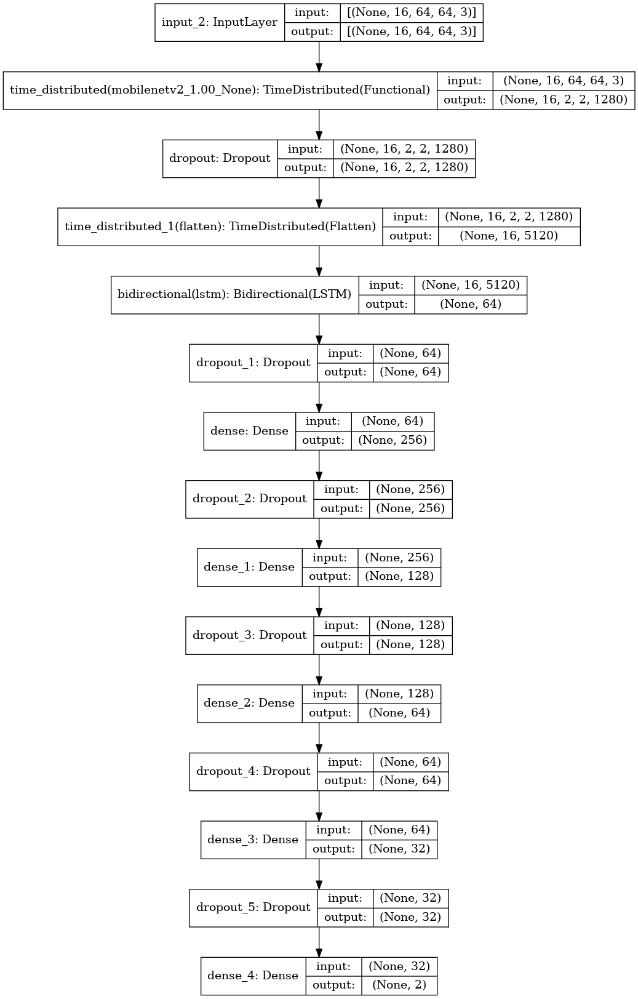

In [ ]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

# **Specifying Callbacks and Fitting**

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = tensorflow.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tensorflow.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)

# Compiling the model
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])

# Fitting the model
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/50
404/404 [==============================] - 220s 519ms/step - loss: 0.6931 - accuracy: 0.5029 - val_loss: 0.6827 - val_accuracy: 0.6077
Epoch 2/50
404/404 [==============================] - 218s 539ms/step - loss: 0.6460 - accuracy: 0.6169 - val_loss: 0.5726 - val_accuracy: 0.7005
Epoch 3/50
404/404 [==============================] - 211s 521ms/step - loss: 0.5459 - accuracy: 0.7383 - val_loss: 0.5302 - val_accuracy: 0.7191
Epoch 4/50
404/404 [==============================] - 208s 516ms/step - loss: 0.4441 - accuracy: 0.8074 - val_loss: 0.3849 - val_accuracy: 0.8255
Epoch 5/50
404/404 [==============================] - 210s 520ms/step - loss: 0.3801 - accuracy: 0.8486 - val_loss: 0.3160 - val_accuracy: 0.8762
Epoch 6/50
404/404 [==============================] - 211s 522ms/step - loss: 0.3260 - accuracy: 0.8805 - val_loss: 0.2630 - val_accuracy: 0.8948
Epoch 7/50
404/404 [==============================] - 209s 516ms/step - loss: 0.2626 - accuracy: 0.9009 - val_loss: 0.3265 -

In [ ]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

15/15 [==============================] - 13s 583ms/step - loss: 0.2485 - accuracy: 0.9443


# **Model Evaluation**

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):

    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Get the Epochs Count
    epochs = range(len(metric_value_1))

    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)

    plt.title(str(plot_name))

    plt.legend()

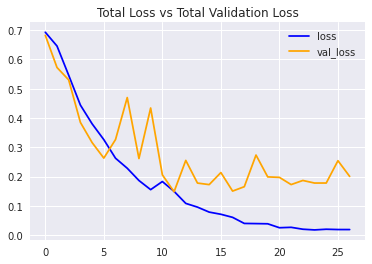

In [ ]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

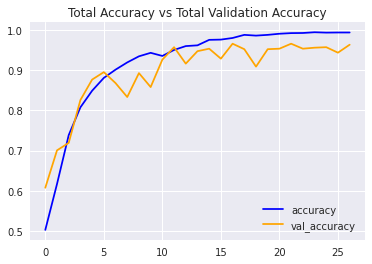

In [ ]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

# **Predicting the Test Set**

In [ ]:
labels_predict = MoBiLSTM_model.predict(features_test)

In [ ]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [ ]:
labels_test_normal.shape , labels_predict.shape

((449,), (449,))

Accuracy Score

In [ ]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.9443207126948775


Confusion Matrix

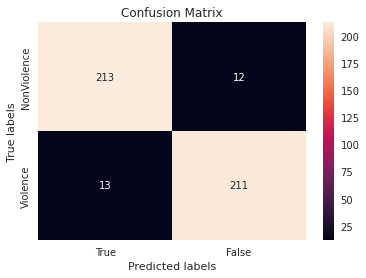

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

Classification Report

In [ ]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.95      0.94       225
           1       0.95      0.94      0.94       224

    accuracy                           0.94       449
   macro avg       0.94      0.94      0.94       449
weighted avg       0.94      0.94      0.94       449



# **Prediction Frame By Frame**

In [ ]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):

    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'),
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)

    # Store the predicted class in the video.
    predicted_class_name = ''

    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():

        ok, frame = video_reader.read()

        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)

        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)

            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]

        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)

        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)

    video_reader.release()
    video_writer.release()

In [ ]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path):

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))

    for counter, random_index in enumerate(random_range, 1):

        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)

        ok, frame = video_reader.read()

        if not ok:
          break

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()

    video_reader.release()

In [ ]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)

output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

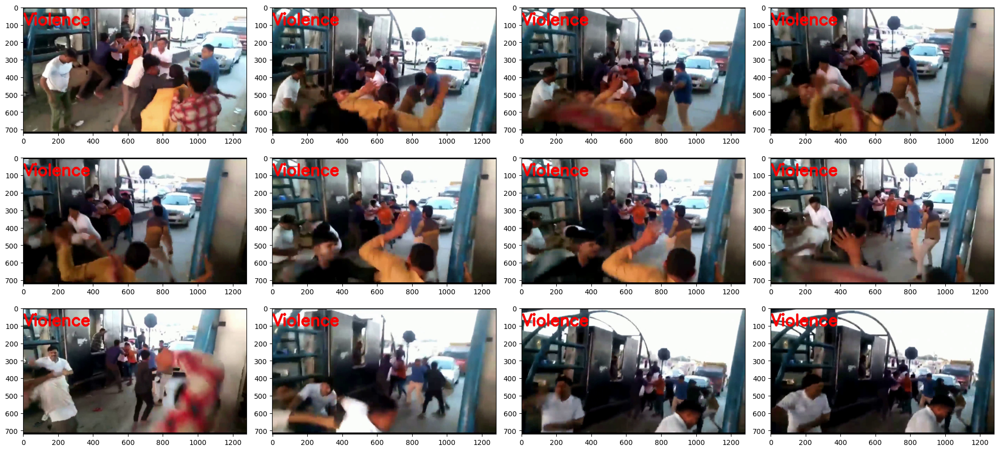

In [ ]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

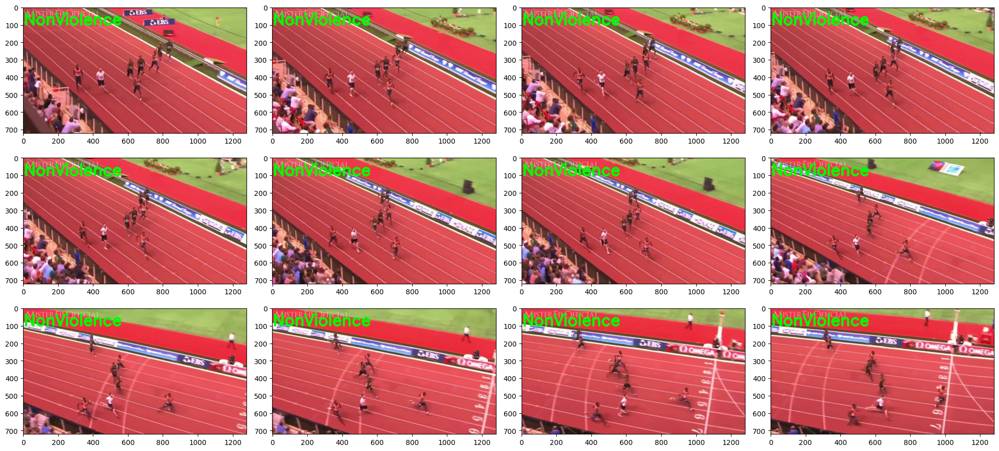

In [ ]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_23.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [ ]:
# Play the actual video
Play_Video(input_video_file_path)

# **Prediction For The Video**

In [ ]:
def predict_video(video_file_path, SEQUENCE_LENGTH):

    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []

    # Store the predicted class in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        success, frame = video_reader.read()

        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

        # Normalize the resized frame.
        normalized_frame = resized_frame / 255

        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]

    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')

    video_reader.release()

In [ ]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: Violence
Confidence: 0.9999209642410278


In [ ]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_23.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: NonViolence
Confidence: 0.9999996423721313


In [ ]:
!pip install twilio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.8 MB/s eta 0:00:00


In [ ]:
from twilio.rest import Client

def send_sms_alert(to_phone_number, message_body):
    account_sid = 'ACCOUNT_SID'
    auth_token = 'AUTH_TOKEN'
    from_phone_number = '+17753683321'

    client = Client(account_sid, auth_token)

    message = client.messages.create(
        body=message_body,
        from_=from_phone_number,
        to=to_phone_number
    )
    print(f"Message sent Succussfully! : SID {message.sid}")


In [ ]:
from twilio.rest import Client

def send_sms_alert(to_phone_number, message_body):
    account_sid = 'ACCOUNT_SID'
    auth_token = 'AUTH_TOKEN'
    from_phone_number = '+17753683321'

    client = Client(account_sid, auth_token)
    message = client.messages.create(
        body=message_body,
        from_=from_phone_number,
        to=to_phone_number
    )
    print(f"SMS sent successfully: SID {message.sid}")

def analyze_video_prediction(prediction, video_name):
    """
    Sends an alert if the video is classified as violent.

    :param prediction: The prediction for the video (1 for violence, 0 for non-violence)
    :param video_name: Name of the video analyzed
    """
    if prediction == 1:
        print(f"Violence detected in video '{video_name}'. Sending alert...")
        send_sms_alert(
            to_phone_number='+91 6363936713',
            message_body=f"ALERT: Violence detected in video '{video_name}'. Immediate attention required!"
        )
    else:
        print(f"No violence detected in video '{video_name}'.")

video_name = "CCTV_Footage_01.mp4"
video_prediction = 1

analyze_video_prediction(video_prediction, video_name)


Violence detected in video 'CCTV_Footage_01.mp4'. Sending alert...
SMS sent successfully: SID SMac5dfc96e72e6e3878f6ab0a2203002b
